In [1]:
import numpy as np
import fitsio
from astropy.table import Table, join
import os, sys
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)
import pandas as pd
import corner
import mpl_scatter_density

# Make the norm object to define the image stretch
from astropy.visualization import LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
norm = ImageNormalize(vmin=0., vmax=1000, stretch=LogStretch())

import sys
sys.path.insert(0, '/global/homes/s/severett/repos/balutils/')
from balutils import stacked_catalogs as sc

import seaborn as sb
plt.style.use('seaborn')
sb.set_context("notebook", font_scale=1.5)

/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  


## Make new catalog

In [13]:
run = 'y3-merged'
ver = 1.2

match_file = '/project/projectdirs/des/severett/Balrog/{}/stacked_catalogs/{}/sof/balrog_matched_catalog_sof_{}_v{}.fits'.format(run, ver, run, ver)
det_file = '/project/projectdirs/des/severett/Balrog/{}/stacked_catalogs/{}/sof/balrog_detection_catalog_sof_{}_v{}.fits'.format(run, ver, run, ver)

match_cols = ['bal_id', 'true_id', 'meas_cm_mag_deredden',  'true_bdf_mag_deredden', 'true_gap_flux_fwhm4asec', 'meas_gapflux',
              'meas_cm_fracdev', 'true_bdf_fracdev', 'meas_cm_T', 'true_bdf_T', 'meas_cm_mag', 'true_bdf_mag', 'meas_cm_flux_s2n', 'meas_cm_s2n_r',
              'true_bdf_g', 'true_bdf_flux_deredden', 'true_bdf_flux_err', 'meas_cm_flux_cov']
det_cols = ['bal_id', 'meas_FLAGS_GOLD_SOF_ONLY', 'flags_foreground', 'flags_footprint', 'flags_badregions', 'match_flag_1.5_asec',
            'meas_EXTENDED_CLASS_SOF', 'ext_mag']
# sof = sc.BalrogMatchedCatalog(match_file, det_file, match_cols=match_cols, match_type='sof_only', vb=True)

print('Loading matched file...')
match = Table(fitsio.read(match_file, columns=match_cols))
print('Loading det file...')
det = Table(fitsio.read(det_file, columns=det_cols))
print('joining...')
sof = join(match, det, keys='bal_id', join_type='inner')
assert len(match) == len(sof)

# Match to Ian's DF classifier
df_file = 'cats/ugriz-mof02-JHK-extcorr_27May20_kNN_class.fits'
df = Table.read(df_file)
df.rename_column('id', 'true_id')

print('Joining with df classifier...')
sof = join(sof, df, keys='true_id', join_type='left')

cuts = np.where(
    (sof['meas_FLAGS_GOLD_SOF_ONLY'] < 2) &
    (sof['flags_foreground'] == 0 ) &
    (sof['flags_footprint'] == 1) &
    (sof['flags_badregions'] < 2) &
    (sof['meas_EXTENDED_CLASS_SOF'] > 1) &
    (sof['match_flag_1.5_asec'] < 2)
)

print('Making cuts...')
sof = sof[cuts]

Loading matched file...
Loading det file...
joining...
Joining with df classifier...
Making cuts...


In [14]:
sof_file = '/project/projectdirs/des/severett/Balrog/paper-plots/cats/balrog_sof_gold_phot_scatter.fits' 
print('Writing catalog...')
sof.write(sof_file, overwrite=True)

Writing catalog...


0.7492311103299242
0.014963172792136138
0.23580571687793964


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([6163773.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,  123099.]),
 array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ]),
 <a list of 10 Patch objects>)

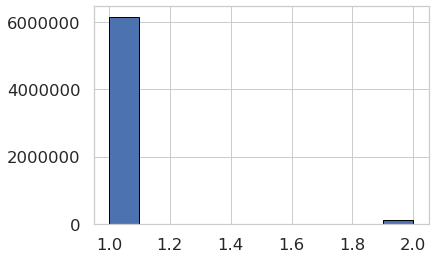

In [17]:
print(1.*len(sof[sof['NearestNeighbors_class'] == 1]) / len(sof))
print(1.*len(sof[sof['NearestNeighbors_class'] == 2]) / len(sof))
print(1.*len(sof[np.isnan(sof['NearestNeighbors_class'])]) / len(sof))
plt.hist(sof['NearestNeighbors_class'], ec='k')

## Load existing catalog

In [2]:
sof_file = '/project/projectdirs/des/severett/Balrog/paper-plots/cats/balrog_sof_gold_phot_scatter.fits'
sof = Table.read(sof_file)

## SOF CM Mag Scatter

In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sb.axisgrid.FacetGrid) or \
            isinstance(self.sg, sb.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sb.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])
        
        # added by me
#         self.sg.ax_marg_x.remove()

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())
        
# set the colormap and centre the colorbar
class MidpointNormalize(colors.Normalize):
	"""
	Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

	e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
	"""
	def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
		self.midpoint = midpoint
		colors.Normalize.__init__(self, vmin, vmax, clip)

	def __call__(self, value, clip=None):
		# I'm ignoring masked values and all kinds of edge cases to make a
		# simple example...
		x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
		return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))
    
def calc_bin_stats(true, diff, bins):
    '''
    Calculate mean offset mean, median, nd scatter in truth bins, given bin edges
    '''
    
    mean = -1*np.ones(len(bins)-1)
    med = -1*np.ones(len(bins)-1)
    scatter = -1*np.ones(len(bins)-1)
    
    bin_mean = np.mean([bins[:-1], bins[1:]], axis=0)
    
    k = 0
    for b1, b2 in zip(bins, bins[1:]):
        sample = np.where((true > b1) & (true <= b2))
        mean[k] = np.mean(diff[sample])
        med[k] = np.median(diff[sample])
        scatter[k] = np.std(diff[sample])
        k += 1
        
    return mean, med, scatter, bin_mean     

def calc_meas_mag_err(true_mag, true_flux, flux_var, bins):
    mag_err = -1*np.ones(len(bins)-1)
    
    bin_mean = np.mean([bins[:-1], bins[1:]], axis=0)
    
    k = 0
    for b1, b2 in zip(bins, bins[1:]):
        sample = np.where((true_mag > b1) & (true_mag <= b2))
        
        sig_f = np.sqrt(flux_var[sample])
        sig_m = (2.5 / np.log(10)) * (sig_f / true_flux[sample])
        var_m = np.power(sig_m, 2)
        
        mag_err[k] = np.sqrt(np.mean(var_m))
        k += 1
        
    return mag_err, bin_mean

/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/corner/corner.py:606: UserWarning: The following kwargs were not used by contour: 'ls'
  ax.contour(X2, Y2, H2.T, V, **contour_kwargs)


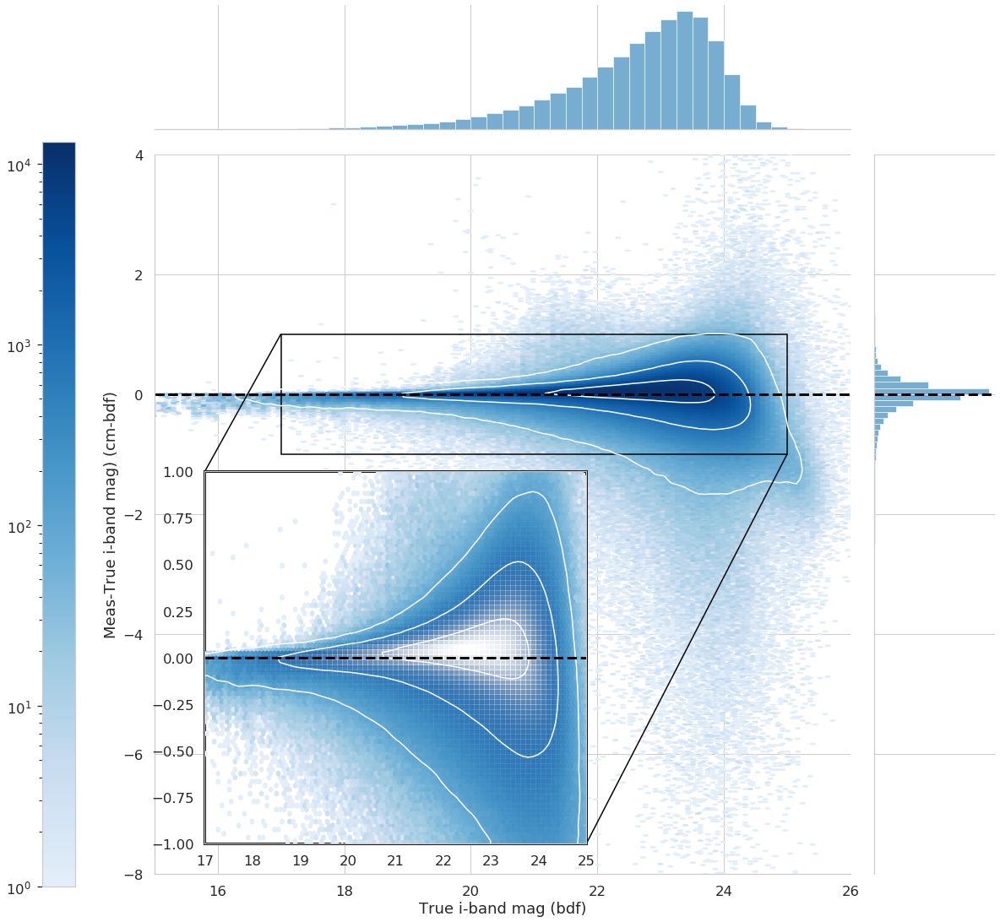

In [26]:
sb.set_style("whitegrid")#, {"axes.facecolor": "0.9"})
# sb.set_style({'axes.facecolor': 'green'})

bindx = dict(zip('griz', range(4)))

xlim = [15, 26]
ylim = [-8, 4]

N = 1
n_levels=4

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vmin = 0.0005
truncated_cmap = truncate_colormap(plt.get_cmap('Blues'), 0.1, 1.0)

b = 'i'
bi = bindx[b]
x = sof['true_bdf_mag_deredden'][:, bi]
y = sof['meas_cm_mag_deredden'][:, bi] - x

cuts = np.where(
    (x > xlim[0]-.5) &
    (x < xlim[1]+.5) &
    (y > ylim[0]-.5) &
    (y < ylim[1]+.5)  )

fig = plt.Figure()

ax1 = fig.add_subplot(1, 1, 1)
# g = sb.JointGrid(x[cuts], y[cuts])
g = sb.JointGrid(x[cuts][::N], y[cuts][::N])

hb_grid = (150, 300)
g = g.plot_joint(plt.hexbin, gridsize=hb_grid, norm=colors.LogNorm(), cmap=truncated_cmap, mincnt=1)
plt.axhline(0, c='k', ls='--', lw=3)
plt.xlabel(f'True {b}-band mag (bdf)')
plt.ylabel(f'Meas-True {b}-band mag) (cm-bdf)')

# If you want the contours on the main plot as well
r = (xlim, ylim)
cuts2 = np.where(
    (x > xlim[0]) &
    (x < xlim[1]) &
    (y > -8) &
    (y < 1)  )
corner.hist2d(x[cuts2][::N], y[cuts2][::N], range=r, bins=200, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=True,
                   color='w', contour_kwargs={'ls':':'}, smooth=True, levels=levels)
plt.axhline(0, c='k', ls='--', lw=3)

plt.xlim(xlim)
plt.ylim(ylim)

# r = ((xlim[0], xlim[1]), (ylim[0], ylim[1]))
# im = corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=100, scale_hist=1,
#                    plot_datapoints=False, plot_density=False, no_fill_contours=True,
#                    color='white')

# Create a set of inset Axes: these should fill the bounding box allocated to
# them.
ax2 = plt.axes([0, 0, 1, 1])
# Manually set the position and relative size of the inset axes within ax1
ip = InsetPosition(ax1, [0.14, 0.085, 0.45, 0.45])
ax2.set_axes_locator(ip)
# Mark the region corresponding to the inset axes on ax1 and draw lines
# in grey linking the two axes.
mark_inset(g.ax_joint.axes, ax2, loc1=2, loc2=4, fc="none", ec='k', lw=1.5)

inset_xlim = [17, 25]
inset_ylim = [-1, 1]
# inset_cuts = np.where(
#     (x > inset_xlim[0]-1) &
#     (x < inset_xlim[1]+1) &
#     (y > inset_ylim[0]-1) &
#     (y < inset_ylim[1]+1)  )
r = (inset_xlim, inset_ylim)

plt.hexbin(x[cuts][::N], y[cuts][::N], gridsize=hb_grid, norm=colors.LogNorm(), cmap=truncated_cmap, mincnt=1)
im = corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color='white', smooth=True, levels=levels)
plt.axhline(0, c='k', ls='--', lw=3)

# Marginals
# g = g.plot_marginals(sb.distplot)
dx = .25
xbins = np.arange(xlim[0], xlim[1], dx)
g.ax_marg_x.hist(x[cuts][::N], color='tab:blue', alpha=.6, bins=xbins)

dy = 0.1
ybins = np.arange(ylim[0], ylim[1]+dy, dy)
g.ax_marg_y.hist(y[cuts][::N], color='tab:blue', alpha=.6, bins=ybins, orientation='horizontal')
g.ax_marg_y.axhline(0, lw=3, c='k', ls='--')

# Colorbar
cbaxes = plt.gcf().add_axes([0.085, 0.15, 0.03, 0.68]) 
cb = plt.colorbar(g.ax_joint._current_image, cax=cbaxes)
cbaxes.yaxis.set_ticks_position('left')

ax2.patch.set_edgecolor('black')  
ax2.patch.set_linewidth('3')  

plt.gcf().set_size_inches(18, 18)
# plt.gcf().suptitle('Balrog y3-merged SOF GOLD sample')

# plt.tight_layout()

plt.gcf().savefig('./figs/gal-mag-response-outliers.pdf', bbox_inches = 'tight')
plt.gcf().savefig('./figs/gal-mag-response-outliers.png', bbox_inches = 'tight')

g 0
r 1
i 2
z 3
saving fig...


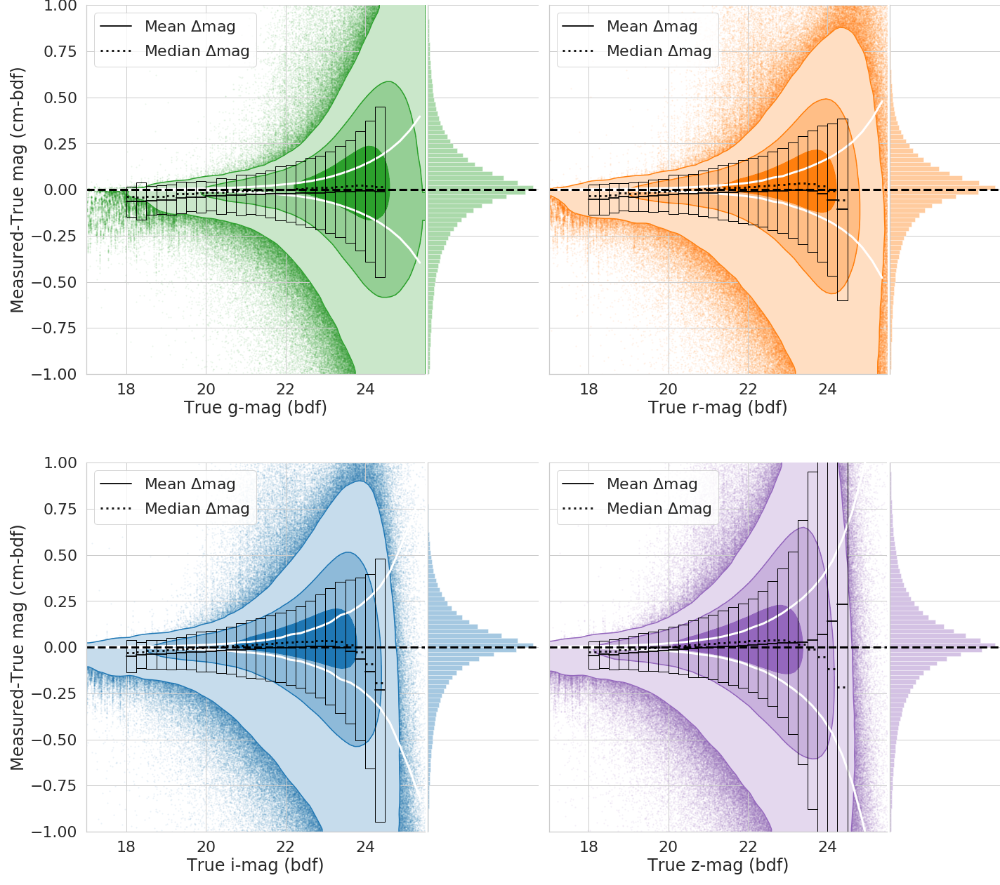

In [22]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

# used in arxiv submission
# SMALL_SIZE = 18
# MEDIUM_SIZE = 24
# BIGGER_SIZE = 26

# used in ApJS resubmission
SMALL_SIZE = 18
MEDIUM_SIZE = 22
BIGGER_SIZE = 24

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [17, 25.5]
ylim = [-1, 1]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 18
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

stats_t = Table()

# Paper requires different format
paper_t = Table()

j = 0
for b, bi in bindx.items():
    j += 1
    if vb is True:
        print(b, bi)
        
    x = sof[f'true_bdf_mag{mag_suffix}'][:, bi]
    y = sof[f'meas_cm_mag{mag_suffix}'][:, bi] - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels, label=False,
                   contour_kwargs={'zorder':1}) # added for ApJS resubmission
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Compare to reported errors
    # Compare to meas estimates
#     dx = 0.2
    dx = 0.25
    xbins2 = np.arange(xlim[0], xlim[1]+dx, dx)
    true_mag = x[cuts][::N]
    true_flux = sof[f'true_bdf_flux{mag_suffix}'][:, bi][cuts][::N]
    flux_var = sof['meas_cm_flux_cov'][:, bi, bi][cuts][::N]
    
    mag_err, bin_mean2 = calc_meas_mag_err(true_mag, true_flux, flux_var, xbins2)
    
    meas_lw = 3
    meas_c = 'white'
    meas_ls = 'solid'
    plt.plot(bin_mean2, mag_err, lw=meas_lw, c=meas_c, ls=meas_ls, zorder=1)
    plt.plot(bin_mean2, -mag_err, lw=meas_lw, c=meas_c, ls=meas_ls, zorder=1)

    # Get rolling bias & scatter
    xbins = np.arange(xlim[0]+1, xlim[1]+dx-1, dx)
    mean, med, scatter, bin_mean = calc_bin_stats(x, y, xbins)
    
    k = 0
    for b1, b2 in zip(xbins, xbins[1:]):
        if k == 0:
            l1 = r'Mean $\Delta$mag'
            l2 = r'Median $\Delta$mag'
        else:
            l1 = None
            l2 = None
        plt.plot([b1, b2], [mean[k], mean[k]], c='k', label=l1, lw=2, alpha=0.9, zorder=5)
        plt.plot([b1, b2], [med[k], med[k]], c='k', ls=':', label=l2, lw=3, alpha=0.9, zorder=5)
#         plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='lightgrey', edgecolor='dimgrey', alpha=0.2)
        plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='None', edgecolor='k', zorder=5)
        k += 1
#     plt.step(xbins[:-1], mean, c='r', label=r'mean $\Delta m$')
#     plt.step(xbins[:-1], med, c='g', label=r'median $\Delta$ m$')

    plt.legend(loc='upper left', fancybox=True, frameon=True)
    
    # Save to table
    stats_t[f'mean_{b}'] = mean
    stats_t[f'med_{b}'] = med
    stats_t[f'std_{b}'] = scatter
    stats_t[f'bin_mean_{b}'] = bin_mean
    
    if 'Mag' not in paper_t.colnames:
        paper_t[f'Mag'] = bin_mean - dx / 2.
    paper_t[f'avg_{b}'] = mean
    paper_t[f'med_{b}'] = med
    paper_t[f'std_{b}'] = scatter

    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-mag (bdf)')
    
    if (j%2) == 1:
        plt.ylabel(f'Measured-True mag (cm-bdf)')
    else:
        plt.gca().yaxis.set_ticklabels([])
        plt.gca().yaxis.label.set_visible(False)
#     plt.ylabel(f'Measured-True {b}-mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins, kde=False)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3, zorder=3)

#     g[b].ax_marg_x.set_axis_off()
  
# s = (20, 20) # Used in arxiv submission
s = (20, 20) # Used in ApJS resubmission
fig = plt.figure(figsize=s)
w, h = 1, 0

gs = gridspec.GridSpec(2, 2) # Used in arxiv submission
# gs = gridspec.GridSpec(2, 2, hspace=0, wspace=0) # Used in ApJS resubmission

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

# mg0.sg.ax_marg_x.remove()

# fig.suptitle('Balrog y3-merged GOLD Sample')
# s = 20
# fig.set_size_inches(s, s)
plt.tight_layout(pad=0.625) # Used for arxiv submission
# plt.tight_layout(rect=(0,0,1.5,1.5)) # Used for ApJS resubmission
# fig.subplots_adjust()

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
stats_t.write(f'./tables/gal-scatter-mag-stats-{l}.fits', overwrite=True)
paper_t.write(f'./tables/galaxy-response-{l}.csv', overwrite=True)

print('saving fig...')
outfile = './figs/balrog-gals-mag-response-revised.pdf'
fig.savefig(outfile, bbox_inches='tight', rasterized=True)

In [29]:
x = sof['meas_cm_mag_deredden'][:,2]
s = np.where( (x > 17) & (x < 19))
y = x[s] - sof['true_bdf_mag_deredden'][:,2][s]

p1, p2 = np.percentile(y, 50), np.percentile(y, 99)
print(p1, p2)

-0.02916636617823265 0.02802595888410146


g 0
r 1
i 2
z 3


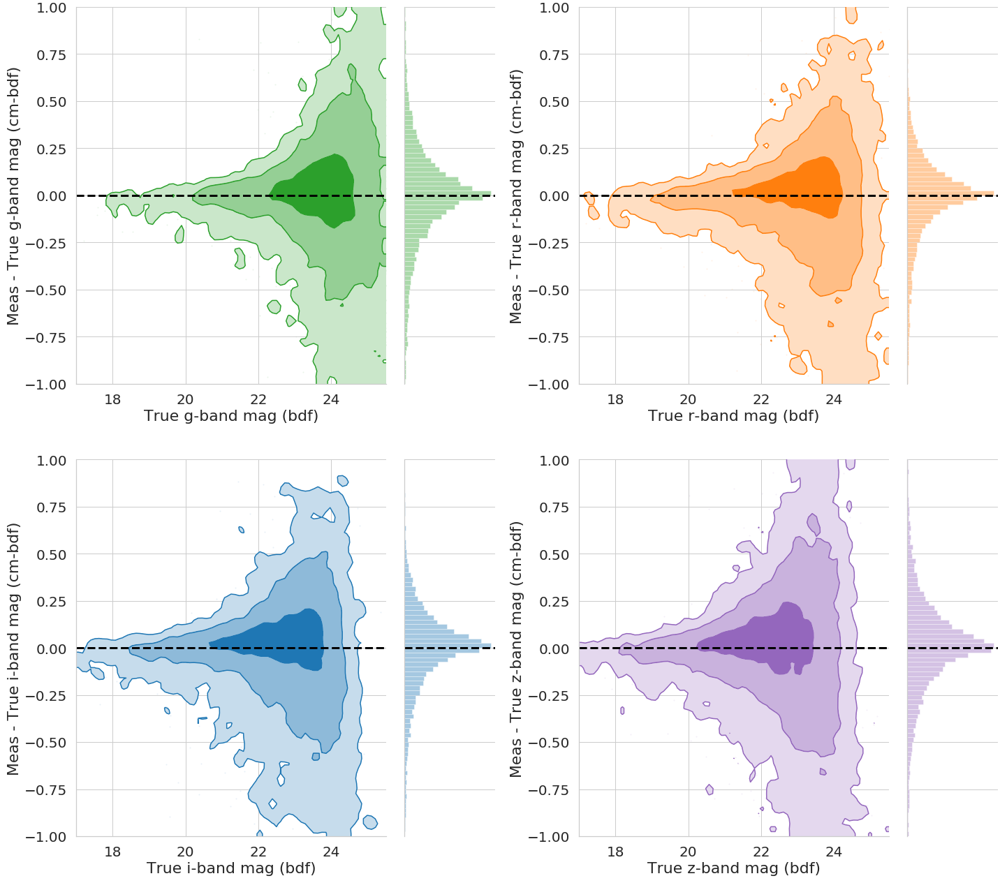

In [20]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 22

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [17, 25.5]
ylim = [-1, 1]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 18
N = 1000
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True
g = {}

mag_suffix = '_deredden' # For corrected mags

stats_t = Table()

j = 0
for b, bi in bindx.items():
    j += 1
    if vb is True:
        print(b, bi)
        
    x = sof[f'true_bdf_mag{mag_suffix}'][:, bi]
    y = sof[f'meas_cm_mag{mag_suffix}'][:, bi] - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    

    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')

    plt.axhline(0, ls='--', c='k', lw=3)

    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-band mag (bdf)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins, kde=False)
    g[b].ax_marg_x._visible = False
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)
    
s = (20, 20)
fig = plt.figure(figsize=s)
w, h = 1, 0
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

plt.tight_layout(h_pad=h, w_pad=w, pad=0.5)

g 0
r 1
i 2


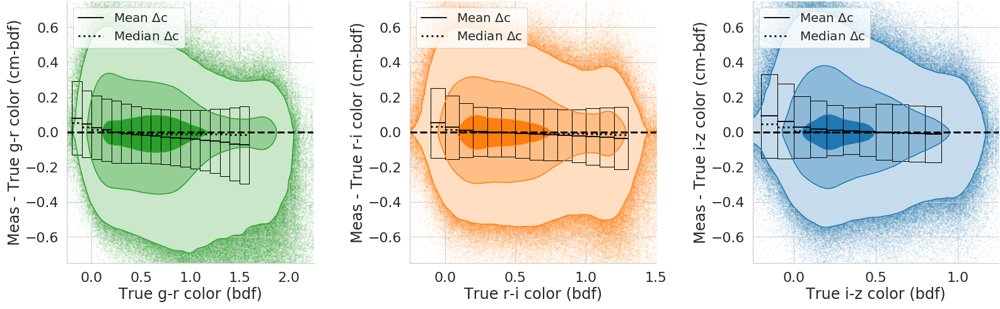

In [11]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

SMALL_SIZE = 20
MEDIUM_SIZE = 22
BIGGER_SIZE = 24

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = ([-0.25, 2.25], [-0.25, 1.5], [-0.25, 1.25])
ylim = [-0.75, 0.75]
bins = 75

cbin_range = ([-0.1, 1.7], [-0.095, 1.4], [-0.1, 1.])
# cbin_dx = (0.1, 0.1, 0.05)
cbin_dx = (0.1, 0.1, 0.1)
# cbin_dx = (0.05, 0.05, 0.05)

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

stats_t = Table()

paper_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if k >= 4:
        break
    if vb is True:
        print(b, bi)
                
    x = sof['true_bdf_mag_deredden'][:, bi] - sof['true_bdf_mag_deredden'][:, bi+1] 
    y = (sof['meas_cm_mag_deredden'][:, bi] - sof['meas_cm_mag_deredden'][:, bi+1]) - x

#     cuts = np.where(
#         (x > xlim[k-1][0]-1) &
#         (x < xlim[k-1][1]+1) &
#         (y > ylim[0]-1) &
#         (y < ylim[1]+1)  )
    
    cuts = np.where(
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )

# ax1 = fig.add_subplot(1, 1, 1)
    r = (xlim[k-1], ylim)

    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    
    # due to non-detections, colors splan unrealistic range
    thresh = 4
    c_cuts = np.where(
        (x > -thresh) &
        (x < thresh) &
        (y > -thresh) &
        (y < thresh) &
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )
    
#     dx = 0.1
#     xbins = np.arange(-1, 2.5+dx, dx)
    dcx = cbin_dx
#     xbins = np.arange(-1, 2.5+dcx[k-1], dcx[k-1])
    xbins = np.arange(-0.2, 2+dcx[k-1], dcx[k-1])
    mean, med, scatter, bin_mean = calc_bin_stats(x[c_cuts], y[c_cuts], xbins)
    
    j = 0
    leg = False
    for b1, b2 in zip(xbins, xbins[1:]):
        if (b2 < cbin_range[k-1][0]) or (b2 > cbin_range[k-1][1]):
            j += 1
            continue
        if leg is False:
            l1 = r'Mean $\Delta$c'
            l2 = r'Median $\Delta$c'
            leg = True
        else:
            l1 = None
            l2 = None
        
        plt.plot([b1, b2], [mean[j], mean[j]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[j], med[j]], c='k', ls=':', label=l2, lw=3, alpha=0.9)
        plt.fill_between([b1, b2], mean[j]+scatter[j], mean[j]-scatter[j], facecolor='None', edgecolor='k')

        j += 1
        
    plt.legend(loc='upper left', fancybox=True, frameon=True)
    
    # Save to table
#     stats_t[f'mean_{b}'] = mean
#     stats_t[f'med_{b}'] = med
#     stats_t[f'std_{b}'] = scatter
#     stats_t[f'bin_mean_{b}'] = bin_mean

    b1, b2 = b, 'griz'[bi+1]
    
    if 'Color' not in paper_t.colnames:
        paper_t[f'Color'] = bin_mean - dcx[k-1] / 2.
    paper_t[f'avg_{b1}-{b2}'] = mean
    paper_t[f'med_{b1}-{b2}'] = med
    paper_t[f'std_{b1}-{b2}'] = scatter

    plt.xlim(xlim[k-1])
    plt.ylim(ylim)
    plt.xlabel(f'True {b1}-{b2} color (bdf)')
    plt.ylabel(f'Meas - True {b1}-{b2} color (cm-bdf)')
    
#     g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins, kde=False)
    g[b].ax_marg_x._visible = False
    g[b].ax_marg_y._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
#     g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(24, 9))

gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout(pad=0.5, h_pad=0.5)
# fig.suptitle('Balrog y3-merged GOLD Sample')
# fig.set_size_inches(12, 4)

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
# stats_t.write(f'./tables/gal-scatter-color-stats-{l}.fits', overwrite=True)
paper_t.write(f'./tables/galaxy-color-response-{l}.csv', overwrite=True)

fig.savefig('./figs/balrog-gals-color-response.pdf', bbox_inches='tight')

g 0
r 1
i 2


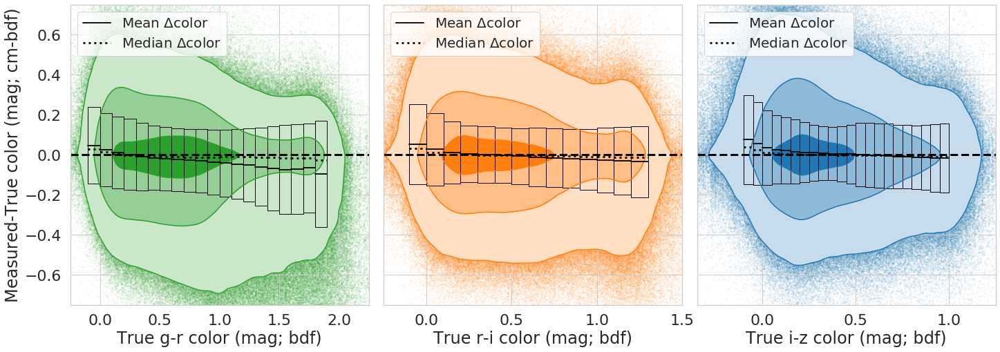

In [5]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

SMALL_SIZE = 20
MEDIUM_SIZE = 22
BIGGER_SIZE = 24

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = ([-0.25, 2.25], [-0.25, 1.5], [-0.35, 1.25])
ylim = [-0.75, 0.75]
bins = 75

cbin_range = ([-0.1, 1.95], [-0.095, 1.4], [-0.1, 1.])
cbin_dx = (0.1, 0.1, 0.05)
# cbin_dx = (0.1, 0.1, 0.1)
# cbin_dx = (0.05, 0.05, 0.05)

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

fig, axes = plt.subplots(1,3, sharey=True)

k = 0
for b, bi in bindx.items():
    k += 1
    if k >= 4:
        break
    if vb is True:
        print(b, bi)
                
    x = sof['true_bdf_mag_deredden'][:, bi] - sof['true_bdf_mag_deredden'][:, bi+1] 
    y = (sof['meas_cm_mag_deredden'][:, bi] - sof['meas_cm_mag_deredden'][:, bi+1]) - x

#     cuts = np.where(
#         (x > xlim[k-1][0]-1) &
#         (x < xlim[k-1][1]+1) &
#         (y > ylim[0]-1) &
#         (y < ylim[1]+1)  )
    
    cuts = np.where(
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )

    plt.subplot(1,3,k)

#     g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    

    r = (xlim[k-1], ylim)
    corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
#     g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
#                    plot_datapoints=False, plot_density=False, no_fill_contours=False,
#                    fill_contours=True,
#                    color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')

    plt.axhline(0, ls='--', c='k', lw=3)

    # Get rolling bias & scatter
    
    # due to non-detections, colors splan unrealistic range
    thresh = 4
    c_cuts = np.where(
        (x > -thresh) &
        (x < thresh) &
        (y > -thresh) &
        (y < thresh) &
        (sof['meas_cm_flux_s2n'][:,bi] > 5) &
        (sof['meas_cm_flux_s2n'][:,bi+1] > 5)
    )
    
#     dx = 0.1
#     xbins = np.arange(-1, 2.5+dx, dx)
    dcx = cbin_dx
#     xbins = np.arange(-1, 2.5+dcx[k-1], dcx[k-1])
    xbins = np.arange(-0.2, 2+dcx[k-1], dcx[k-1])
    mean, med, scatter, bin_mean = calc_bin_stats(x[c_cuts], y[c_cuts], xbins)
    
    j = 0
    leg = False
    for b1, b2 in zip(xbins, xbins[1:]):
        if (j == 0) and (bi == 0):
            j += 1
            continue
        if (b2 < cbin_range[k-1][0]) or (b2 > cbin_range[k-1][1]):
            j += 1
            continue
        if leg is False:
            l1 = r'Mean $\Delta$color'
            l2 = r'Median $\Delta$color'
            leg = True
        else:
            l1 = None
            l2 = None
        
        plt.plot([b1, b2], [mean[j], mean[j]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[j], med[j]], c='k', ls=':', label=l2, lw=3, alpha=0.9)
        plt.fill_between([b1, b2], mean[j]+scatter[j], mean[j]-scatter[j], facecolor='None', edgecolor='k')

        j += 1
        
    plt.legend(loc='upper left', fancybox=True, frameon=True)

    b1, b2 = b, 'griz'[bi+1]

    plt.xlim(xlim[k-1])
    plt.ylim(ylim)
    plt.xlabel(f'True {b1}-{b2} color (mag; bdf)')
    plt.ylabel(f'Measured-True color (mag; cm-bdf)')

    if k != 1:
        plt.gca().set(ylabel=None)
        plt.gca().get_yaxis().set_ticklabels([])
    
# fig = plt.figure(figsize=(24, 8))
fig.set_size_inches(24, 8)


plt.subplots_adjust(wspace=0.05)
# plt.tight_layout(pad=0.5, h_pad=0.5)

# plt.tight_layout()

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
    
fig.savefig('./figs/balrog-gals-color-response-resize.pdf', bbox_inches='tight')

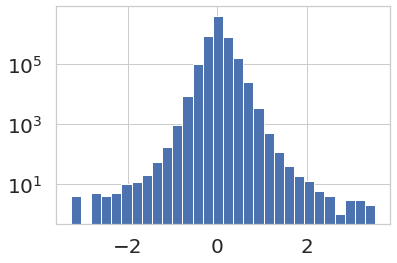

In [38]:
plt.hist(y[c_cuts], bins=30)
plt.yscale('log')

(-5, 5)

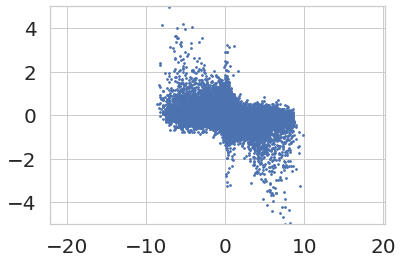

In [27]:
plt.scatter(x[c_cuts], y[c_cuts], s=3)
plt.ylim(-5, 5)

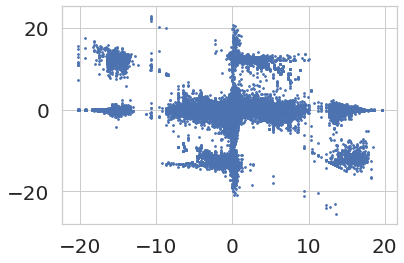

In [26]:
plt.scatter(x, y, s=3)

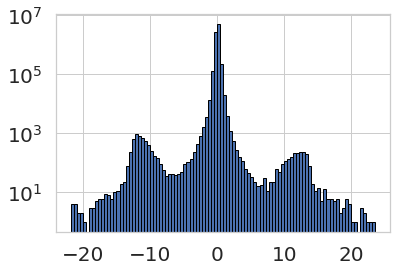

In [25]:
m = sof['meas_cm_mag_deredden'][:,2] - sof['meas_cm_mag_deredden'][:,1]
t = sof['true_bdf_mag_deredden'][:,2] - sof['true_bdf_mag_deredden'][:,1]

plt.hist(m-t, ec='k', bins=100)
plt.yscale('log')

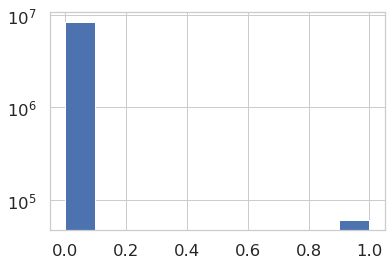

In [22]:
plt.hist(sof['flags_badregions'])
plt.yscale('log')

## Size (T)

Plotting sample...


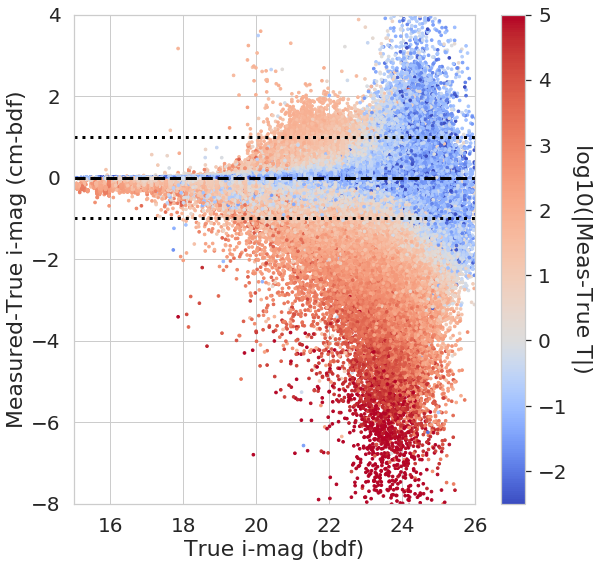

In [24]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 22

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

b = 'i'

bindx = dict(zip('griz', range(4)))

bi = bindx[b]

xlim = [15, 26]
ylim = [-8, 4]
alpha = 1.0
# size = 22

vmin, vmax = -2.5, 5

print('Plotting sample...')

N = 1
T_err = sof['meas_cm_T'] - sof['true_bdf_T']
T_err = np.log10(np.abs(T_err))

x = sof['true_bdf_mag_deredden'][::N,bi]
y = sof['meas_cm_mag_deredden'][::N,bi] - x
    
# cmap = 'RdBu'
cmap = 'coolwarm'
plt.scatter(x, y, s=7, alpha=alpha, c=T_err[::N], cmap=cmap, norm=MidpointNormalize(midpoint=0, vmin=vmin, vmax=vmax))
# plt.xlim(xlim)
# plt.ylim(ylim)
# plt.show()
# Make sure to get all the outliers in the plot
# print('Plotting outliers...')
# cuts = np.where(T_err > .5)
# x = sof['true_bdf_mag_deredden'][:,bi][cuts]
# y = sof['meas_cm_mag_deredden'][:,bi][cuts] - x

# plt.scatter(x, y, s=5, alpha=alpha, c=T_err[cuts], cmap='RdBu', norm=MidpointNormalize(midpoint=0, vmin=vmin, vmax=vmax))

# Reference lines
plt.axhline(-1, lw=3, ls=':', c='k')
plt.axhline(0, lw=3, ls='--', c='k')
plt.axhline(1, lw=3, ls=':', c='k')

plt.xlim(xlim)
plt.ylim(ylim)

plt.xlabel('True {}-mag (bdf)'.format(b))
plt.ylabel('Measured-True {}-mag (cm-bdf)'.format(b))
cbar = plt.colorbar()
cbar.set_label('log10(|Meas-True T|)', rotation=270, labelpad=25)
    
# plt.suptitle('Balrog Run2 (BDF) Noiseless Grid Test', fontsize=24, y=0.9)
plt.gcf().set_size_inches(9, 9)
plt.gcf().savefig('./figs/mag-response-by-T.png', rasterized=True, bbox_inches='tight', optimize=True, dpi=400)
plt.gcf().savefig('./figs/mag-response-by-T.pdf', rasterized=True, bbox_inches='tight')

## Some tests...

g 0


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


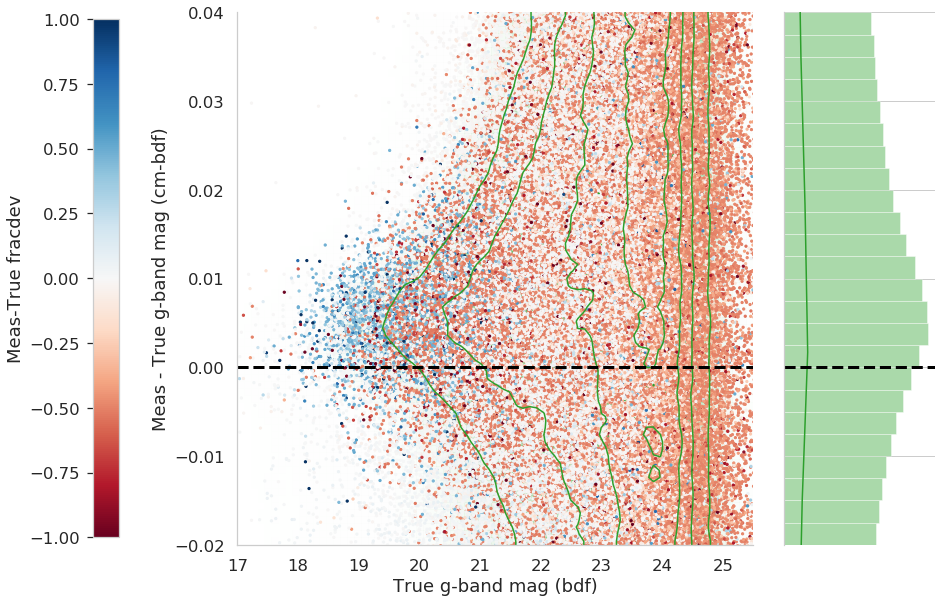

r 1


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


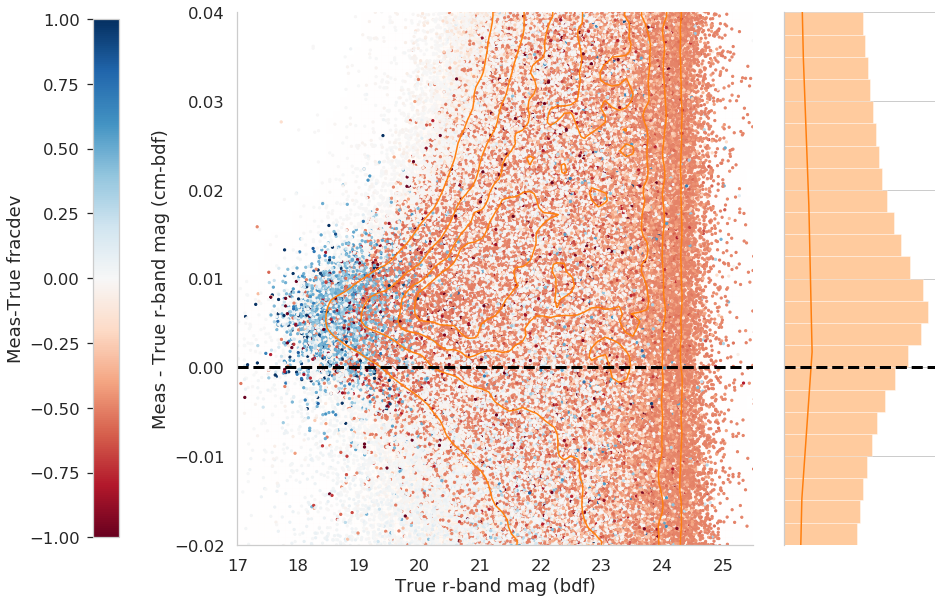

i 2


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


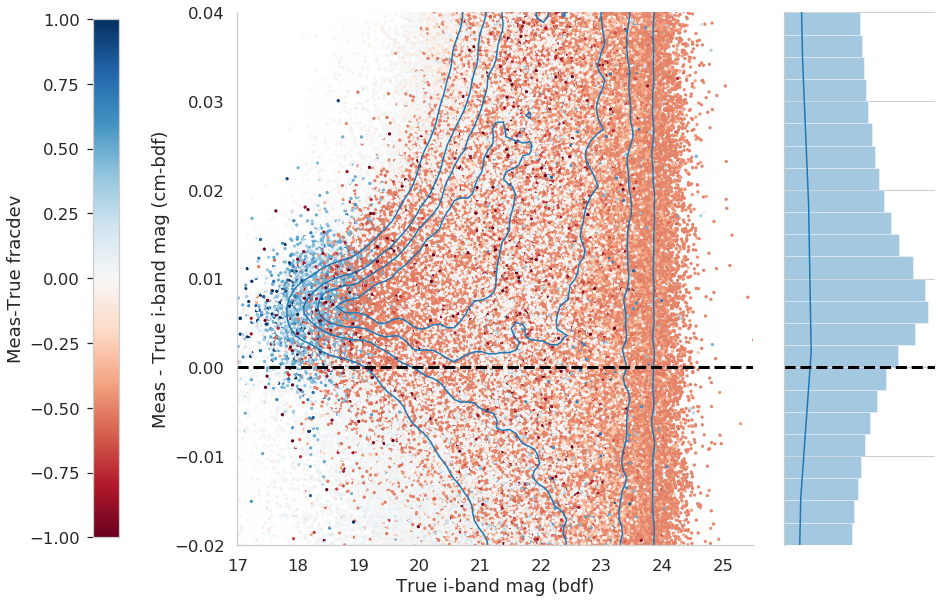

z 3


/global/homes/s/severett/.conda/envs/balrog-plots/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


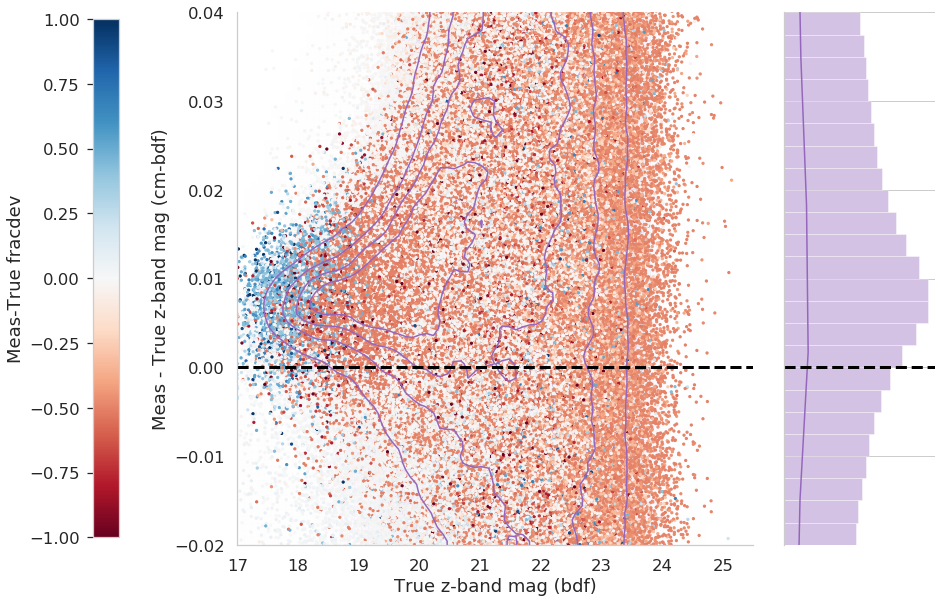

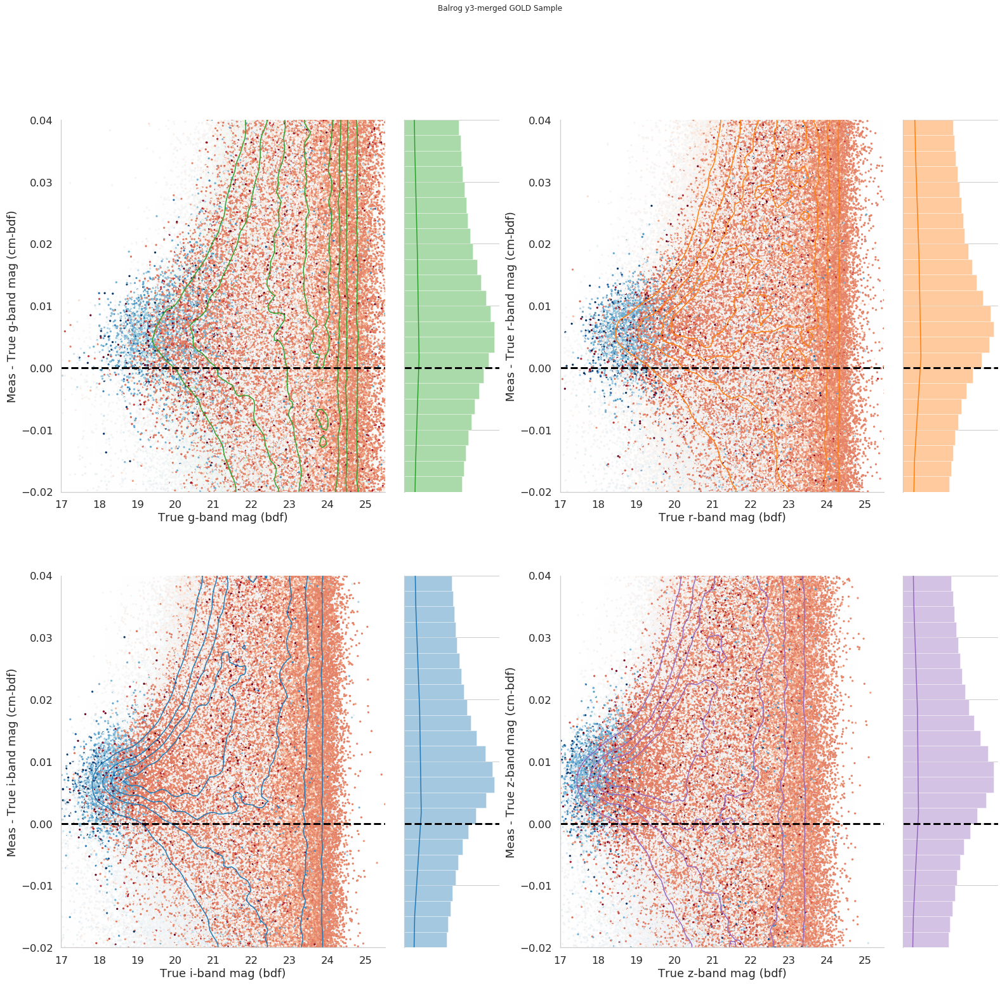

In [25]:
sb.set_style("whitegrid")#, {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(len(bands))))

xlim = [17, 25.5]
ylim = [-0.020, 0.040]
r = (xlim, ylim)
bins = 75

dy = 0.0025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 22
N = 2
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']

vb = True
show_fd_scatter = True

# fig, axes = plt.subplots(2, 2)

g = {}

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color=c[bi], smooth=True, lw=3)
    
    # If you want extra fracdev scatter plot
    if show_fd_scatter is True:
        alpha = 1
        size = 5
        M = 10
        fd_err = (sof['meas_cm_fracdev'][cuts][::M*N] - sof['true_bdf_fracdev'][cuts][::M*N])
        scatter = plt.scatter(x[cuts][::M*N], y[cuts][::M*N], alpha=alpha, c=fd_err, cmap='RdBu', s=size,
                    norm=MidpointNormalize(midpoint=0, vmin=np.min(fd_err), vmax=np.max(fd_err)))
    
#     plt.colorbar(g[b].ax_joint.collections[0])
    plt.axhline(0, ls='--', c='k', lw=3)
#     mean = np.mean(y[cuts][::N])
#     plt.axhline(mean, ls='--', c='r', lw=3, label=f'med={mean}')
#     plt.legend()
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-{bands[bi+1]} color (bdf)')
    plt.ylabel(f'Meas - True {b}-{bands[bi+1]} color (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)
    
    # Colorbar
    if show_fd_scatter is True:
        cbaxes = plt.gcf().add_axes([0.0, 0.15, 0.03, 0.6]) 
        cb = plt.colorbar(g[b].ax_joint._current_image, cax=cbaxes)
        cbaxes.yaxis.set_ticks_position('left')
        cb.set_label('Meas-True fracdev', rotation=90)
        cbaxes.yaxis.set_label_position('left')
    
    plt.gcf().set_size_inches(12, 12)
    plt.show()

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

gs.tight_layout(fig)

# mg0.sg.ax_marg_x.remove()

        
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

## Colors

g 0
r 1
i 2


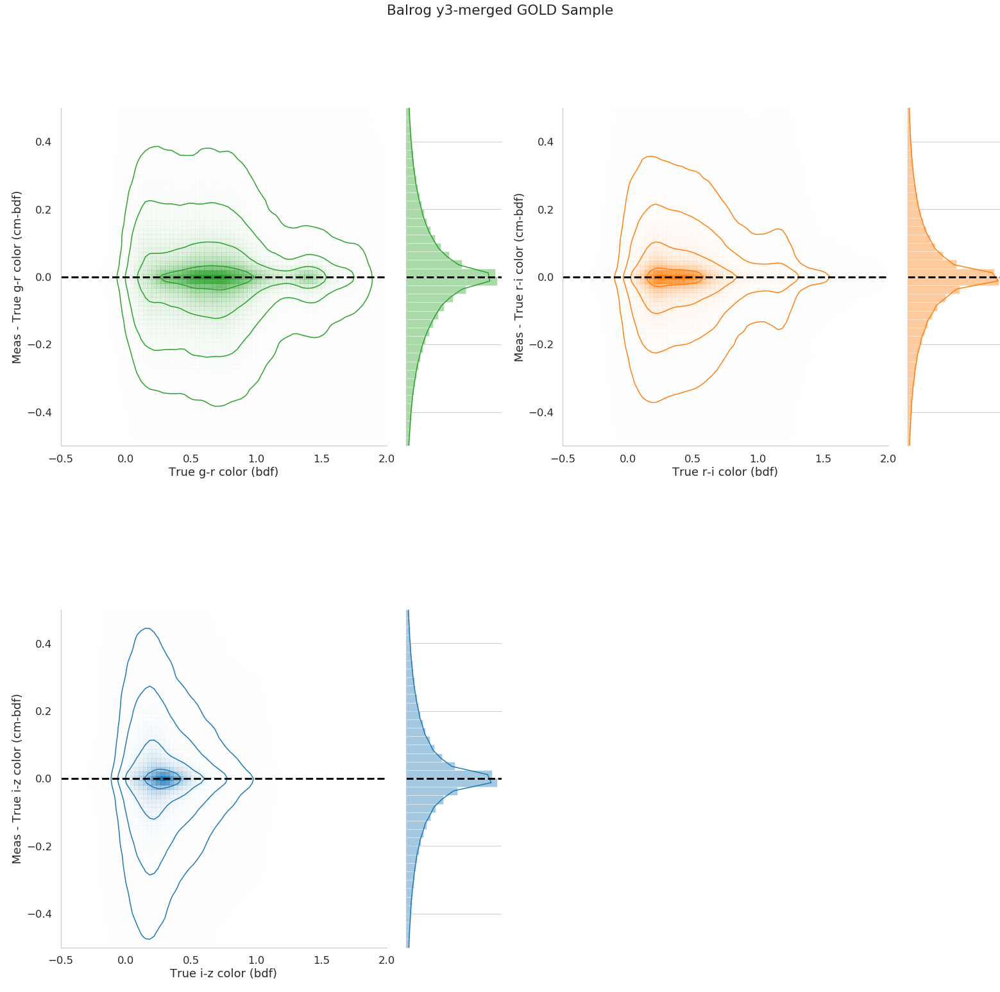

In [188]:
bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [-.5, 2]
ylim = [-.5, .5]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 22
N = 10
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

k = 0
for b, bi in bindx.items():
    k += 1
    if k >= 4:
        break
    if vb is True:
        print(b, bi)
        
    x = sof['true_bdf_mag_deredden'][:, bi] - sof['true_bdf_mag_deredden'][:, bi+1] 
    y = (sof['meas_cm_mag_deredden'][:, bi] - sof['meas_cm_mag_deredden'][:, bi+1]) - x

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=True, no_fill_contours=True,
                   color=c[bi], smooth=True, lw=3)
#     plt.colorbar(g[b].ax_joint.collections[0])
    plt.axhline(0, ls='--', c='k', lw=3)
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.xlabel(f'True {b}-{bands[bi+1]} color (bdf)')
    plt.ylabel(f'Meas - True {b}-{bands[bi+1]} color (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
# mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

gs.tight_layout(fig)

# mg0.sg.ax_marg_x.remove()

        
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

[0.1175031  0.2451604  0.39346934 0.54216664 0.67534753 0.78373483
 0.86466472]
0
8271506
8135157
plotting true...
plotting meas...


No handles with labels found to put in legend.


1
8276971
8204163
plotting true...
plotting meas...


No handles with labels found to put in legend.


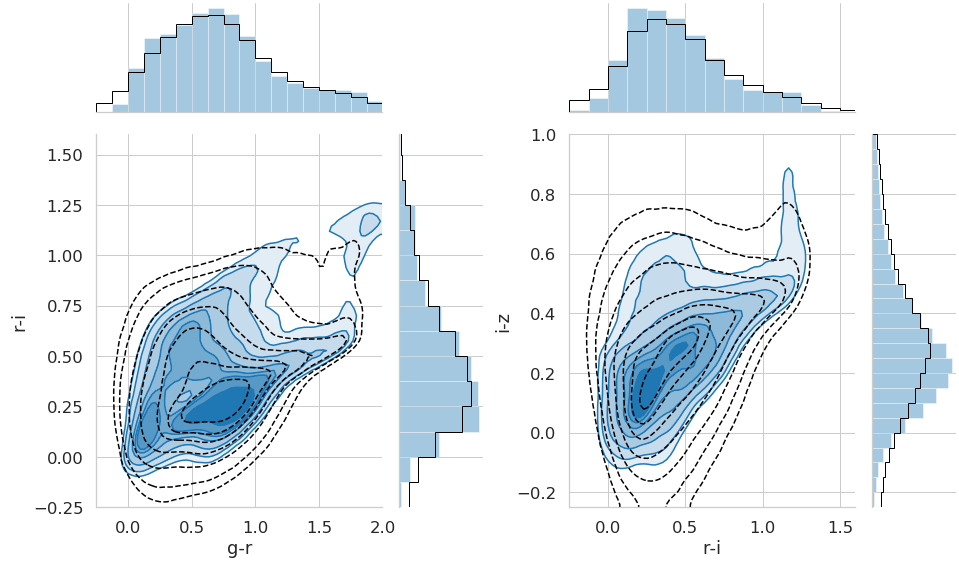

In [11]:
sb.set_style('whitegrid')

bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

dx = [0.125, 0.125]
dy = [0.125, 0.05]
xlim = ([-.25, 2], [-.25, 1.6]) # For 2 sig
ylim = ([-.25, 1.6], [-.25, 1.0]) # For 2 sig
# xlim = ([-.75, 3.5], [-.75, 2.5]) # For 3 sig
# ylim = ([-.75, 2.5], [-.75, 1.25]) # For 3 sig
r = ((xlim[0], ylim[0]), (xlim[1], ylim[1]))

bins = 75
n_levels = 4

dl = 0.25
levels = 1.0 - np.exp(-0.5 * np.arange(0.5, 2.0+dl, dl) ** 2)
# levels = 1.0 - np.exp(-0.5 * np.arange(1.0, +dl, dl) ** 2)
# levels = 1.0 - np.exp(-0.5 *np.array([1, 2, 2.5]) ** 2)
print(levels)

# N = 1000
frac = 1. # Fraction of data to plot

true_c = 'tab:blue'
meas_c = 'k'

joint = 'corner'

true_mag_colname = 'true_bdf_mag_deredden'
meas_mag_colname = 'meas_cm_mag_deredden'

vb = True

# fig, axes = plt.subplots(2, 2)

g = []

k = 0
colors = ['g-r', 'r-i', 'i-z']
for k in range(2):
    if vb is True:
        print(f'{k}')
        
    c1b1, c1b2 = colors[k][0], colors[k][2]
    c2b1, c2b2 = colors[k+1][0], colors[k+1][2]
        
    true_x = sof[true_mag_colname][:, k]  - sof[true_mag_colname][:, k+1]  # g-r
    true_y = sof[true_mag_colname][:, k+1]  - sof[true_mag_colname][:, k+2]  # r-i
    meas_x = sof[meas_mag_colname][:, k] - sof[meas_mag_colname][:, k+1] # g-r
    meas_y = sof[meas_mag_colname][:, k+1] - sof[meas_mag_colname][:, k+2] # r-i

    true_cuts = np.where(
        (true_x > xlim[k][0]-1) &
        (true_x < xlim[k][1]+1) &
        (true_y > ylim[k][0]-1) &
        (true_y < ylim[k][1]+1)  )
    
    meas_cuts = np.where(
        (meas_x > xlim[k][0]-1) &
        (meas_x < xlim[k][1]+1) &
        (meas_y > ylim[k][0]-1) &
        (meas_y < ylim[k][1]+1)  )

    Ntcuts = len(true_cuts[0])
    Nmcuts = len(meas_cuts[0])
    true_sample = np.random.choice(np.arange(Ntcuts), int(Ntcuts*frac), replace=False)
    meas_sample = np.random.choice(np.arange(Nmcuts), int(Nmcuts*frac), replace=False)

#     g.append(sb.JointGrid(true_x[true_cuts][::N], true_y[true_cuts][::N], ratio=3))
    g.append(sb.JointGrid(true_x[true_cuts][true_sample], true_y[true_cuts][true_sample], ratio=3))

    if vb is True:
        print(len(true_x[true_cuts][true_sample]))
        print(len(meas_x[meas_cuts][meas_sample]))
        print('plotting true...')
    if joint == 'kde':
        p = g[k].plot_joint(sb.kdeplot, color='tab:blue', shade=True, label='True',
                        shade_lowest=False, n_levels=n_levels)
    elif joint == 'corner':
        p = g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
#                plot_density=True, fill_contours=False, no_fill_contours=True
               plot_density=False, fill_contours=True,
               plot_datapoints=False, data_kwargs={'alpha':0.01}, levels=levels,
               color=true_c, smooth=True, lw=3, label='True')
    
    if vb is True:
        print('plotting meas...')
    if joint == 'kde':
        sb.kdeplot(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                   color='k', linestyles='--', shade=False, label='Meas', alpha=0.7, n_levels=n_levels)
    elif joint == 'corner':
        corner.hist2d(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                      range=r[k], bins=bins, scale_hist=1, 
                      contour_kwargs={'linestyles':'dashed'},
                      plot_datapoints=False, data_kwargs={'alpha':0.01}, plot_density=False, 
                      no_fill_contours=True, levels=levels,
                      color=meas_c, smooth=True, lw=3, label='Meas')
        
    g[k].ax_joint.legend(loc='lower right') 
        
    plt.xlabel(f'{colors[k]}')
    plt.ylabel(f'{colors[k+1]}')
    plt.xlim(xlim[k])
    plt.ylim(ylim[k]) 
    
    xbins = np.arange(xlim[k][0], xlim[k][1]+dx[k], dx[k])
    ybins = np.arange(ylim[k][0], ylim[k][1]+dy[k], dy[k])
    
#     g[k].plot_marginals(sb.distplot, color='tab:blue', kde=False)
    sb.distplot(true_x[true_cuts][true_sample], color='tab:blue', bins=xbins, kde=False, ax=g[k].ax_marg_x, axlabel=False)
    sb.distplot(true_y[true_cuts][true_sample], color='tab:blue', bins=ybins, kde=False, ax=g[k].ax_marg_y, axlabel=False, vertical=True)
    g[k].ax_marg_x.hist(meas_x[meas_cuts][meas_sample], histtype='step', color='k', bins=xbins)
    g[k].ax_marg_y.hist(meas_y[meas_cuts][meas_sample], histtype='step', color='k', bins=ybins, orientation='horizontal')
    
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g[0], fig, gs[0])
mg1 = SeabornFig2Grid(g[1], fig, gs[1])

# fig.suptitle('Balrog y3-merged GOLD Sample')
gs.tight_layout(fig)

fig.set_size_inches(24, 5)

fig.savefig('./figs/delta-gal-color-color.png')
fig.savefig('./figs/delta-ga-color-color.pdf')

0
8276730
plotting true...
plotting meas...


No handles with labels found to put in legend.


1
8274763
plotting true...
plotting meas...


No handles with labels found to put in legend.


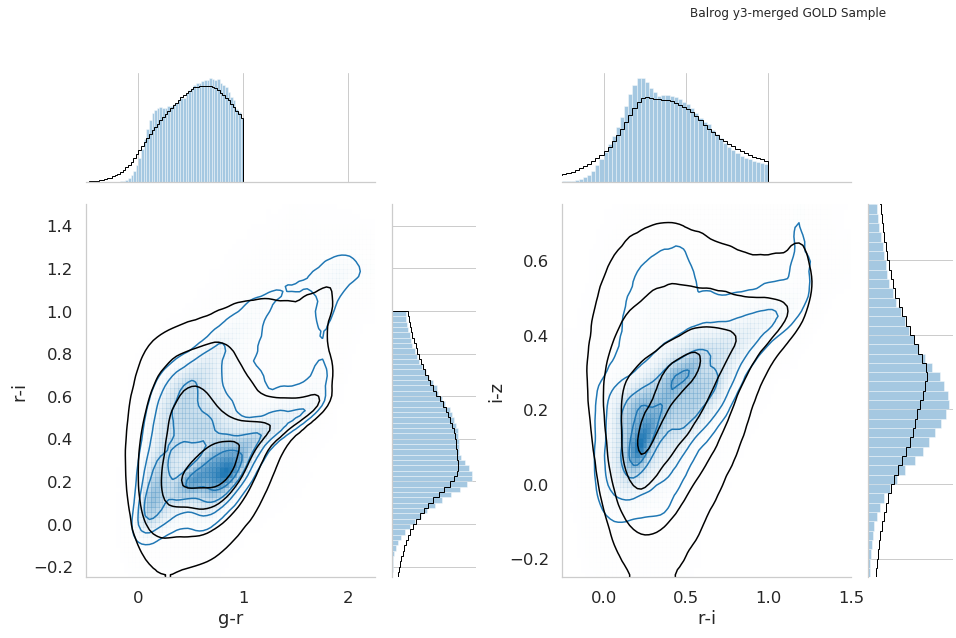

In [5]:
bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = ([-.5, 2.25], [-.25, 1.5])
ylim = ([-.25, 1.5], [-.25, 0.75])
r = ((xlim[0], ylim[0]), (xlim[1], ylim[1]))

bins = 75
n_levels = 5

# dx = 0.125
# xbins = np.arange(xlim[0], xlim[1]+dx, dx)
# dy = 0.1
# ybins = np.arange(ylim[0], ylim[1]+dy, dy)

N = 1

true_c = 'tab:blue'
meas_c = 'k'

joint = 'corner'

vb = True

# fig, axes = plt.subplots(2, 2)

g = []

k = 0
colors = ['g-r', 'r-i', 'i-z']
for k in range(2):
    if vb is True:
        print(f'{k}')
        
    true_x = sof['true_bdf_mag_deredden'][:, k] - sof['true_bdf_mag_deredden'][:, k+1] # g-r
    true_y = sof['true_bdf_mag_deredden'][:, k+1] - sof['true_bdf_mag_deredden'][:, k+2] # r-i
    meas_x = sof['meas_cm_mag_deredden'][:, k] - sof['meas_cm_mag_deredden'][:, k+1] # g-r
    meas_y = sof['meas_cm_mag_deredden'][:, k+1] - sof['meas_cm_mag_deredden'][:, k+2] # r-i

    true_cuts = np.where(
        (true_x > xlim[k][0]-1) &
        (true_x < xlim[k][1]+1) &
        (true_y > ylim[k][0]-1) &
        (true_y < ylim[k][1]+1)  )
    
    meas_cuts = np.where(
        (meas_x > xlim[k][0]-1) &
        (meas_x < xlim[k][1]+1) &
        (meas_y > ylim[k][0]-1) &
        (meas_y < ylim[k][1]+1)  )

    g.append(sb.JointGrid(true_x[true_cuts][::N], true_y[true_cuts][::N], ratio=3))
    if vb is True:
        print(len(true_x[true_cuts][::N]))
        print('plotting true...')
    if joint == 'kde':
        g[k].plot_joint(sb.kdeplot, color='tab:blue', shade=True, label='True',
                        shade_lowest=False, n_levels=n_levels)
    elif joint == 'corner':
        g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
               plot_datapoints=False, plot_density=True, no_fill_contours=True,
               color=true_c, smooth=True, lw=3, label='True')
    if vb is True:
        print('plotting meas...')
    if joint == 'kde':
        sb.kdeplot(meas_x[meas_cuts][::N], meas_y[meas_cuts][::N],
                   color='k', linestyles='--', shade=False, label='Meas', n_levels=n_levels, alpha=0.7)
    elif joint == 'corner':
        corner.hist2d(meas_x[meas_cuts][::N], meas_y[meas_cuts][::N],
                      range=r[k], bins=bins, scale_hist=1, linestyles='--',
                      plot_datapoints=False, plot_density=False, no_fill_contours=True,
                      color=meas_c, smooth=True, lw=3, label='Meas')
    plt.legend(loc='lower right')
    plt.xlabel(f'{colors[k]}')
    plt.ylabel(f'{colors[k+1]}')
    plt.xlim(xlim[k])
    plt.ylim(ylim[k]) 
    
    g[k].plot_marginals(sb.distplot, color='tab:blue', bins=ybins, kde=False)
#     colors = [sb.set_hls_values('tab:blue', l=l) for l in np.linspace(1, 0, 12)]
#     cmap = sns.blend_palette(colors, as_cmap=True)
#     g[k].ax_marg_x.hist(true_x[true_cuts][::N], color='tab:blue', bins=xbins)
#     g[k].ax_marg_y.hist(true_y[true_cuts][::N], color='tab:blue', bins=ybins, orientation='horizontal')
#     g[k].x = meas_x
#     g[k].y = meas_y
    g[k].ax_marg_x.hist(meas_x[meas_cuts][::N], histtype='step', color='k', bins=ybins)
    g[k].ax_marg_y.hist(meas_y[meas_cuts][::N], histtype='step', color='k', bins=ybins, orientation='horizontal')
#     g[k].plot_marginals(sb.distplot, kde=False)#, hist_kws={'histtype':'step', 'color':'k'})
#     if vb is True:
#         print('plotting meas...')
#     g[k].plot_joint(sb.kdeplot, color='tab:green', shade=True, legend='Meas')
#     g[k].plot_marginals(sb.distplot, color='tab:green', bins=ybins)
#     plt.colorbar(g[b].ax_joint.collections[0])
#     plt.axhline(0, ls='--', c='k', lw=3)
    # Colorbar
#     cbaxes = plt.gcf().add_axes([0.01, 0.15, 0.03, 0.68])
#     counts, xedges, yedges, im = plt.hist2d(x[cuts][::N], y[cuts][::N], norm=colors.LogNorm(), bins=75)
#     cb = plt.colorbar(im)
#     cbaxes.yaxis.set_ticks_position('left')
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g[k].plot_joint(plt.hexbin, gridsize=50)   
    
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g[0], fig, gs[0])
mg1 = SeabornFig2Grid(g[1], fig, gs[1])

fig.suptitle('Balrog y3-merged GOLD Sample')
gs.tight_layout(fig)

fig.set_size_inches(22, 9)

0
8154648
8027135
plotting true...
plotting meas...


No handles with labels found to put in legend.


1
8153803
8095145
plotting true...
plotting meas...


No handles with labels found to put in legend.


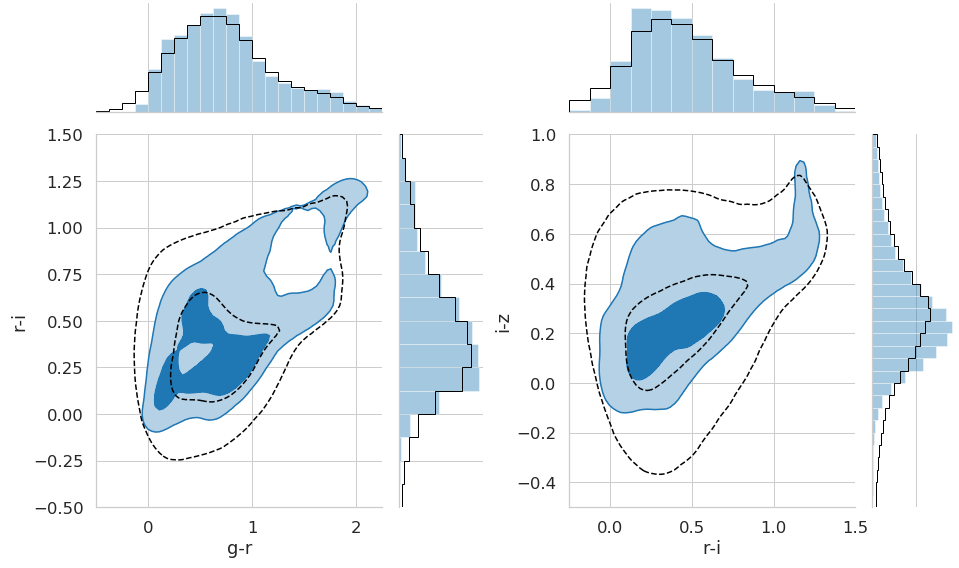

In [5]:
sb.set_style('whitegrid')

bindx = dict(zip('griz', [0,1,2,3]))

bands = 'griz'
bindx = dict(zip('griz', range(4)))

dx = [0.125, 0.125]
dy = [0.125, 0.05]
xlim = ([-.5, 2.25], [-.25, 1.5])
ylim = ([-.5, 1.5], [-.5, 1.0])
r = ((xlim[0], ylim[0]), (xlim[1], ylim[1]))

bins = 75
# n_levels = 4

# levels = np.ones(3) - np.array([0.989, 0.865, 0.393]) # 2d sigma values
# levels = np.array([0.393, 0.865, 1.]) # 2d sigma values
dl=1
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 2+dl, dl) ** 2)

# N = 1000
frac = 1 # Fraction of data to plot

true_c = 'tab:blue'
meas_c = 'k'

joint = 'corner'

vb = True

# fig, axes = plt.subplots(2, 2)

g = []

k = 0
colors = ['g-r', 'r-i', 'i-z']
for k in range(2):
    if vb is True:
        print(f'{k}')
        
    c1b1, c1b2 = colors[k][0], colors[k][2]
    c2b1, c2b2 = colors[k+1][0], colors[k+1][2]
        
    true_x = sof['true_bdf_mag_deredden'][:, k] - sof['true_bdf_mag_deredden'][:, k+1] # g-r
    true_y = sof['true_bdf_mag_deredden'][:, k+1] - sof['true_bdf_mag_deredden'][:, k+2] # r-i
    meas_x = sof['meas_cm_mag_deredden'][:, k] - sof['meas_cm_mag_deredden'][:, k+1] # g-r
    meas_y = sof['meas_cm_mag_deredden'][:, k+1] - sof['meas_cm_mag_deredden'][:, k+2] # r-i

    true_cuts = np.where(
        (true_x > xlim[k][0]-1) &
        (true_x < xlim[k][1]+1) &
        (true_y > ylim[k][0]-1) &
        (true_y < ylim[k][1]+1)  )
    
    meas_cuts = np.where(
        (meas_x > xlim[k][0]-1) &
        (meas_x < xlim[k][1]+1) &
        (meas_y > ylim[k][0]-1) &
        (meas_y < ylim[k][1]+1)  )

    Ntcuts = len(true_cuts[0])
    Nmcuts = len(meas_cuts[0])
    true_sample = np.random.choice(np.arange(Ntcuts), int(Ntcuts*frac), replace=False)
    meas_sample = np.random.choice(np.arange(Nmcuts), int(Nmcuts*frac), replace=False)

#     g.append(sb.JointGrid(true_x[true_cuts][::N], true_y[true_cuts][::N], ratio=3))
    g.append(sb.JointGrid(true_x[true_cuts][true_sample], true_y[true_cuts][true_sample], ratio=3))

    if vb is True:
        print(len(true_x[true_cuts][true_sample]))
        print(len(meas_x[meas_cuts][meas_sample]))
        print('plotting true...')
    if joint == 'kde':
        p = g[k].plot_joint(sb.kdeplot, color='tab:blue', shade=True, label='True',
                        shade_lowest=True, levels=levels)#n_levels=n_levels)
    elif joint == 'corner':
#         p = g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
#                plot_datapoints=False, plot_density=True, no_fill_contours=True,
#                color=true_c, smooth=True, lw=3, levels=levels, label='True')
        p = g[k].plot_joint(corner.hist2d, range=r[k], bins=bins, scale_hist=1,
#                plot_density=True, fill_contours=False, no_fill_contours=True
               plot_density=False, fill_contours=True,
               plot_datapoints=False, data_kwargs={'alpha':0.01}, levels=levels,
               color=true_c, smooth=True, lw=3, label='True')

    
    if vb is True:
        print('plotting meas...')
    if joint == 'kde':
        sb.kdeplot(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                   color='k', linestyles='--', shade=False, label='Meas', levels=levels, alpha=0.7)
    elif joint == 'corner':
#         corner.hist2d(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
#                       range=r[k], bins=bins, scale_hist=1, linestyles='--',
#                       plot_datapoints=False, plot_density=False, no_fill_contours=True,
#                       color=meas_c, smooth=True, lw=3, levels=levels, label='Meas')
        corner.hist2d(meas_x[meas_cuts][meas_sample], meas_y[meas_cuts][meas_sample],
                  range=r[k], bins=bins, scale_hist=1, 
                  contour_kwargs={'linestyles':'dashed'},
                  plot_datapoints=False, data_kwargs={'alpha':0.01}, plot_density=False, 
                  no_fill_contours=True, levels=levels,
                  color=meas_c, smooth=True, lw=3, label='Meas')
    g[k].ax_joint.legend(loc='lower right') 
        
    plt.xlabel(f'{colors[k]}')
    plt.ylabel(f'{colors[k+1]}')
    plt.xlim(xlim[k])
    plt.ylim(ylim[k]) 
    
    xbins = np.arange(xlim[k][0], xlim[k][1]+dx[k], dx[k])
    ybins = np.arange(ylim[k][0], ylim[k][1]+dy[k], dy[k])
    
#     g[k].plot_marginals(sb.distplot, color='tab:blue', kde=False)
    sb.distplot(true_x[true_cuts][true_sample], color='tab:blue', bins=xbins, kde=False, ax=g[k].ax_marg_x, axlabel=False)
    sb.distplot(true_y[true_cuts][true_sample], color='tab:blue', bins=ybins, kde=False, ax=g[k].ax_marg_y, axlabel=False, vertical=True)
    g[k].ax_marg_x.hist(meas_x[meas_cuts][meas_sample], histtype='step', color='k', bins=xbins)
    g[k].ax_marg_y.hist(meas_y[meas_cuts][meas_sample], histtype='step', color='k', bins=ybins, orientation='horizontal')
    
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, 3)

mg0 = SeabornFig2Grid(g[0], fig, gs[0])
mg1 = SeabornFig2Grid(g[1], fig, gs[1])

# fig.suptitle('Balrog y3-merged GOLD Sample')
gs.tight_layout(fig)

plt.gca().grid()

fig.set_size_inches(24, 5)

In [13]:
N = 100

bindx = dict(zip('griz', range(4)))

k = 0
for b in 'i':
    print(f'{b}, {1} of 4')
    bi = bindx[b]
    x = sof['true_bdf_mag_deredden'][:, bi]
    y = sof['meas_cm_mag_deredden'][:, bi] - x
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, norm=norm, dpi=20)
    ax.set_xlim(15, 27)
    ax.set_ylim(-10, 8)
    plt.gcf().set_size_inches(8,8)
    fig.colorbar(density, label='Number of points per pixel')
    


TypeError: 'tuple' object is not callable

g 0
r 1
i 2
z 3


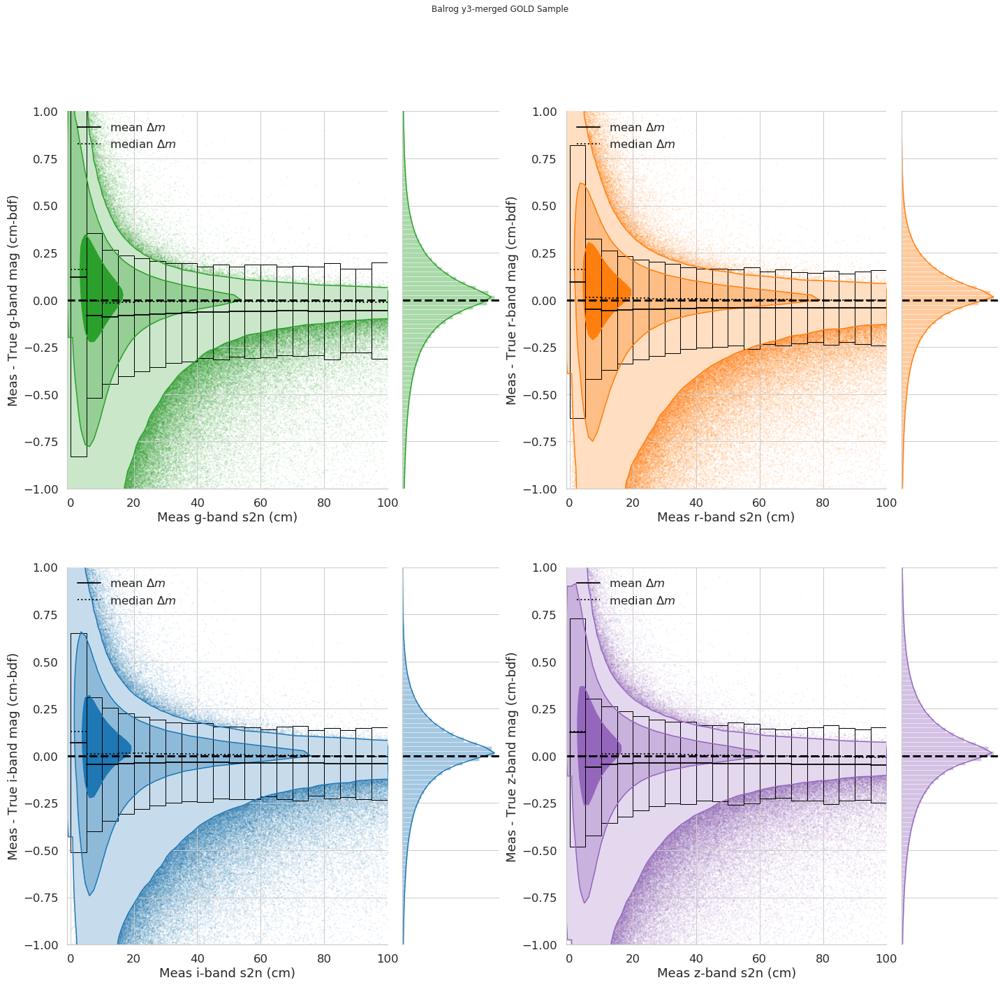

In [55]:
sb.set_style("whitegrid")# {"axes.facecolor": "0.9"})

bands = 'griz'
bindx = dict(zip('griz', range(4)))

xlim = [0, 100]
ylim = [-1, 1]
r = (xlim, ylim)
bins = 75

dy = 0.025
ybins = np.arange(ylim[0], ylim[1]+dy, dy)

s = 20
N = 1
c = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple']
# c = ['limegreen', 'salmon', 'skyblue', 'orchid']

dl = 1.0
levels = 1.0 - np.exp(-0.5 * np.arange(dl, 3.+dl, dl) ** 2)

vb = True

# fig, axes = plt.subplots(2, 2)

g = {}

mag_suffix = '_deredden' # For corrected mags
# mag_suffix = '' # For uncorrected mags

stats_t = Table()

k = 0
for b, bi in bindx.items():
    k += 1
    if vb is True:
        print(b, bi)
        
    x = sof['meas_cm_flux_s2n'][:, bi]
    y = sof[f'meas_cm_mag{mag_suffix}'][:, bi] - sof[f'true_bdf_mag{mag_suffix}'][:, bi]

    cuts = np.where(
        (x > xlim[0]-1) &
        (x < xlim[1]+1) &
        (y > ylim[0]-1) &
        (y < ylim[1]+1)  )

# ax1 = fig.add_subplot(1, 1, 1)
    g[b] = sb.JointGrid(x[cuts][::N], y[cuts][::N], ratio=3)    
#     plt.subplot(2, 2, k)  
#     corner.hist2d(x[cuts][::N], y[cuts][::N], range=r, bins=bins, color=c[bi])
#     g[b].plot_joint(plt.hexbin, gridsize=50, color=c[bi])
    g[b].plot_joint(corner.hist2d, range=r, bins=75, scale_hist=1,
                   plot_datapoints=False, plot_density=False, no_fill_contours=False,
                   fill_contours=True,
                   color=c[bi], smooth=True, lw=3, alpha=0.01, levels=levels)
    plt.plot(x[cuts][::N], y[cuts][::N], "o", ms=2, zorder=-1, rasterized=True, alpha=0.1, c=c[bi], mec='None')
#     plt.hist2d(x[cuts][::10*N], y[cuts][::10*N], range=r, bins=75, scale_hist=1,
#                    plot_datapoints=True, plot_density=False, no_fill_contours=True,
#                    plot_contours=False, color=c[bi])
    plt.axhline(0, ls='--', c='k', lw=3)
#     g = sb.JointGrid(x[cuts][::N], y[cuts][::N], ax=plt.gca())
#     g.plot_joint(plt.hexbin, gridsize=50)

    # Get rolling bias & scatter
    dx = 5
    xbins = np.arange(xlim[0], xlim[1]+dx, dx)
    mean, med, scatter = calc_bin_stats(x, y, xbins)
    
    k = 0
    for b1, b2 in zip(xbins, xbins[1:]):
        if k == 0:
            l1 = r'mean $\Delta m$'
            l2 = r'median $\Delta m$'
        else:
            l1 = None
            l2 = None
        plt.plot([b1, b2], [mean[k], mean[k]], c='k', label=l1, lw=2, alpha=0.9)
        plt.plot([b1, b2], [med[k], med[k]], c='k', ls=':', label=l2, lw=2, alpha=0.9)
#         plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='lightgrey', edgecolor='dimgrey', alpha=0.2)
        plt.fill_between([b1, b2], mean[k]+scatter[k], mean[k]-scatter[k], facecolor='None', edgecolor='k')
        k += 1
#     plt.step(xbins[:-1], mean, c='r', label=r'mean $\Delta m$')
#     plt.step(xbins[:-1], med, c='g', label=r'median $\Delta$ m$')
    plt.legend(loc='upper left')
    
    # Save to table
    stats_t[f'mean_{b}'] = mean
    stats_t[f'med_{b}'] = med
    stats_t[f'std_{b}'] = scatter

    plt.xlim(xlim - np.array([1, 0]))
    plt.ylim(ylim)
    plt.xlabel(f'Meas {b}-band s2n (cm)')
    plt.ylabel(f'Meas - True {b}-band mag (cm-bdf)')
    
    g[b].plot_marginals(sb.distplot, color=c[bi], bins=ybins)
    g[b].ax_marg_x._visible = False
#     g[b].ax_marg_y.hist(y[cuts][::N], color=c[bi], bins=ybins, orientation='horizontal')
    g[b].ax_marg_y.axhline(0, ls='--', c='k', lw=3)

#     g[b].ax_marg_x.set_axis_off()
    
fig = plt.figure(figsize=(s, s))
gs = gridspec.GridSpec(2, 2)

mg0 = SeabornFig2Grid(g['g'], fig, gs[0])
mg1 = SeabornFig2Grid(g['r'], fig, gs[1])
mg2 = SeabornFig2Grid(g['i'], fig, gs[2])
mg3 = SeabornFig2Grid(g['z'], fig, gs[3])

# mg0.sg.ax_marg_x.remove()

plt.tight_layout()
fig.suptitle('Balrog y3-merged GOLD Sample')
fig.set_size_inches(s, s)

# Save table
if 'deredden' in mag_suffix:
    l = 'deredden'
else:
    l = 'uncorrected'
stats_t.write(f'./tables/gal-scatter-mag-stats-{l}-s2n.fits', overwrite=True)

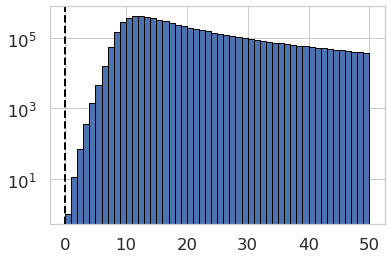

In [47]:
plt.hist(sof['meas_cm_s2n_r'],bins=np.arange(0, 51, 1), ec='k')
plt.axvline(0, ls='--', c='k', lw=2)
plt.yscale('log')

In [48]:
low = sof[sof['meas_cm_s2n_r'] <= 5]
print(len(low))

1830


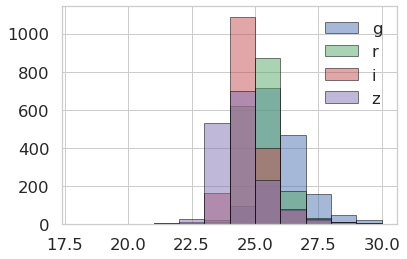

In [51]:
bins = np.arange(18, 31, 1)
for bi in range(4):
    plt.hist(low['meas_cm_mag'][:,bi], label='griz'[bi], bins=bins, ec='k', alpha=0.5)
plt.legend()

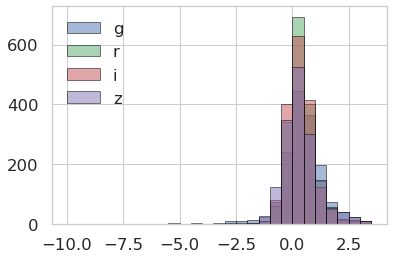

In [54]:
bins = np.arange(-10, 4, 0.5)
for bi in range(4):
    plt.hist(low['meas_cm_mag'][:,bi]-low['true_bdf_mag'][:,bi], label='griz'[bi], bins=bins, ec='k', alpha=0.5)
plt.legend()